# Single-Cell Data Analysis Notebook

v3.0

The purpose of this notebook is to give a basic example of how to perform single-cell analysis of SpaceM data, more precisely the following steps:  

- Loading configuration file generated by Napari SpaceM QC
- Loading multiple datasets
- QC & Preprocessing
- Dimensionality reduction (i.e. creating a UMAP)
- Clustering
- Differential expression (DE) analysis

Before you use this notebook, also consider checking out [this primer](https://scanpy.readthedocs.io/en/stable/usage-principles.html) on the core usage principles of Scanpy, the main Python package we're going to use for single-cell analysis.

You are also invited to also use this notebook as a basis for your own analysis - keep in mind however that each analysis often needs to be custom-tailored to your data, so this notebook is designed to be easily customized.

### Setup


<div class="alert alert-info">
Make sure to install both [Scanpy](https://scanpy.readthedocs.io/en/stable/installation.html) and [Napari-SpaceM-QC](https://grp-alexandrov.embl-community.io/spacem-tutorials/examples/napari_spacem_qc/getting-started.html#setup-on-your-local-machine) before running this notebook!

</div>

First, we import some packages:

In [1]:
%load_ext autoreload
%autoreload 2

# Initial imports:
import os.path
from IPython.core.display import HTML

import numpy as np

import napari_spacem_qc
import outer_spacem as osm
import pandas as pd
import scanpy as sc
import seaborn as sns
from IPython.core.display_functions import display
import matplotlib
from matplotlib import pyplot as plt

from napari_spacem_qc.anndata_utils import bulk_read_from_qc_config
from napari_spacem_qc.debug_utils import disable_interactive_plots
from napari_spacem_qc.config.spacem_qc_config import SpaceMQCConfigFile
from napari_spacem_qc import qc_plots
from napari_spacem_qc import anndata_utils
from napari_spacem_qc import DE_plots


%matplotlib inline
%config InlineBackend.figure_formats = ['retina']

font = {'family' : 'normal',
        # 'weight' : 'bold',
        'size'   : 10}
matplotlib.rc('font', **font)

SNS_FONT_SCALE = 0.5

sns.set(
    rc={
        "figure.figsize":(5, 5),
        "legend.frameon": False
    },
    style="ticks",
    context="talk",
    font_scale=SNS_FONT_SCALE
)

# 1. Loading and customizing the configuration file
## Loading the configuration file generated by Napari SpaceM QC
In order to run this notebook, you will first need to generate a configuration file via the `Napari SpaceM QC` Napari plugin:
  - The configuration file is usually called `config.yml`
  - By using the configuration file, you will be able to quickly load all the datasets in your project, and you won't need to specify again all the metadata columns.

Specify the config file path in the cell below.

In [2]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
# Insert the config file path:
config_file_path = "/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/g_shared/shared/alberto/projects/spacem-reports/australia-project/2024/all_astrocytes/config.yml"
# Important: if you plan to use the multi-report generation feature, make sure to define the `config_file_path` exactly in this cell that is tagged with the "parameters" tag, otherwise the multi-report generation will fail.
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

In [3]:
# Load configuration file:
report_config = SpaceMQCConfigFile.create_config_from_yaml_file(config_file_path)

## Customize config parameters (optional)
Sometimes, while performing data analysis, you may need to change and finetune some parameters that you initially chose when generating the QC report using the SpaceM QC Napari plugin.

You have few options to do it:
1. For complex changes (e.g. an update of the `metadata.csv` file, a change of parameters for AnnData download from METASPACE, etc), it is recommended to use the SpaceM QC napari plugin. After you are done making your mods, save the config file in Napari and then load it again in this notebook.
2. However, for minor changes, you can also modify some parameters directly from here (see the next section)
3. Manual changes to the configuration file are discouraged, since they could make the configuration invalid and raise error messages that are not easy to parse

### Updating configuration parameters from this notebook
If you decide to modify some parameters directly from this notebook, read the following steps and then make your modifications in the next code cell:
1. Open the configuration file with a text editor and find the name of the parameter you want to customize. Parameters in the config are organized in sections and subsections, for example, the `min_pixels_per_annotation` parameter is part of the `filtering_options` subsection of the `general` section:
    ```
    general:
      analysis_id: Single cell UOW (excluding Slide TS36)
      spacem_processing_done: true
       filtering_options:
            min_pixels_per_annotation: 1
            min_annotations_per_pixel: 1
      ...
    pixel_and_cell_qc:
      apply_bbknn: false
    ```
2. Once you have established the correct name of the parameter, you can access the section of the `report_config` object in the following way:
    ```python
    print("Previous parameter value:")
    print(report_config.general.filtering_options.min_pixels_per_annotation)
    # Now choose a new value:
    report_config.general.filtering_options.min_pixels_per_annotation = 200
    ```
3. After you have made all your parameter modifications, do not forget to run `report_config.validate_config()`: this will make sure that all your modifications are valid.
4. Optionally, you can also decide to save these modifications to the configuration file by running `report_config.dump_configuration()`, once you decide to make them permanent (Warning: this will overwrite your original config file!)

In [4]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
# # Make your own parameters modifications here.
# # Some examples:
# report_config.general.bio_key = "new_bio_column"
# report_config.general.masking_key = "new_mask_column"
# report_config.general.filtering_options.min_pixels_per_annotation = 30
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

There is also a "custom" section of the config file, where you can add your own parameters. This can be useful if you plan to add some extra parameters in this notebook and then save them to the config file for keeping track of them later on. 
For example, you can add a new parameter `my_custom_parameter`:

In [5]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
# my_custom_parameters = {
#     "my_custom_parameter": "my_custom_value",
#     "my_custom_parameter_2": 123
# }
# report_config.sc_analysis_notebook.user_custom_options = my_custom_parameters
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

Finally, **always validate the config after your modifications** and (possibly) save them to the config file:

In [6]:
report_config.validate_config()

### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
# Comment out the following line if you want to permanently save these modifications to the config file. Warning: This will overwrite your original config file!
# report_config.dump_configuration(alternative_save_path=None) # or specify an alternative path
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

### Defining target instances (cells or pixels) and which AnnData files to load
You can use this notebook both for performing single-cell data analysis and pixel analysis.

Specify your choice in the cell below or load the default one from the config (depending on this choice, the correct type of AnnData files and some default options will be loaded)

In [7]:
# Load the default value from the config file, alternatively you can set it manually to "cells" or "pixels":
target_instances = report_config.type_of_instances

print(f"Target instances: {target_instances}")

Target instances: pixels


Depending on the value of `target_instances` variable, we will load the correct type of AnnData files (single-cell data or AM data). 

In the following cell, the variable `adata_to_load` is set automatically, but feel free to also manually set it to one of the three following values:
- "spacem_cell" (for single-cell data)
- "spacem_am" (for pixel data)
- "metaspace" (for pixel data downloaded from METASPACE)

In [8]:
# Establish adata_type and validate user choice:
if target_instances == "cells":
    adata_to_load = "spacem_cell"
elif target_instances == "pixels":
    if report_config.general.spacem_processing_done:
        adata_to_load = "spacem_am"
    else:
        adata_to_load = "metaspace"
else:
    raise ValueError(f"Invalid value for `target_instances` var: {target_instances}."
                     f"Valid values are: 'cells' or 'pixels'")
print(f"Loading `{adata_to_load}` AnnData files")

Loading `metaspace` AnnData files


### Print loaded configuration parameters
Here there are the loaded configuration parameters:

In [9]:
# If you wish, you can print some of the parameters of the configuration file, as printed in the default Pixel/PostSpaceM QC reports:
qc_plots.mprint(
    qc_plots.get_notebook_header(
        report_config,
        report_title="My customized report",
        adata_type=adata_to_load)
)


# Astrocytes (P14D14) - April 2024 - UOW 
## My customized report
Project description: 6 slides, 8 wells each, with two conditions ("No treatment" and "TNFa and IL1b"), Slides 1-3 acquired at UOW, Slides 4-6 acquired at EMBL

Date: `2024-04-25`

Config: `/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/g_shared/shared/alberto/projects/spacem-reports/australia-project/2024/all_astrocytes/config.yml`

Notebook version: `v0.3.0.post31+g25e3f32.d20240318 (git-commit: b5c09cc)`

## Report parameters
- Biological key: `treatment`
- Slide key: `slide`
- Process slides independently: `False`
- Replicate key: `replicate_nb_overall`
- Masking key: `only_EMBL`
- AnnDatas Type: `AnnDatas downloaded from METASPACE (see section below for details about used databases and METASPACE parameters)`
- AnnData Files loaded using the following pattern: `/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/g_shared/shared/alberto/projects/spacem-reports/australia-project/2024/all_astrocytes/metaspace_adata/{slide}-{row}{col}.h5ad`
- Metadata file path: `/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/g_shared/shared/alberto/projects/spacem-reports/australia-project/2024/all_astrocytes/astrocytes_all.csv`
- Log transform Applied: `True`
- TIC Normalization Applied: `True`

- **BBKN was applied** (using `slide` as batch key)


### Parameters used to download data from Metaspace and mask background pixels
- selection_metabolites: `['C40H80NO8P+H', 'C5H14NO4P+H']`,
- selection_threshold: `0.75`,
- databases: `[('CoreMetabolome', 'v3'), ('SwissLipids', '2018-02-02'), ('HMDB', 'v4'), ('KEGG', 'v1')]`,
- fdr: `0.5`
- use_TIC_normalized_intensities: `True`
        
    

### Print list of datasets in main project
First, we plot the replicate coverage:

[Go back to index](#main_index)

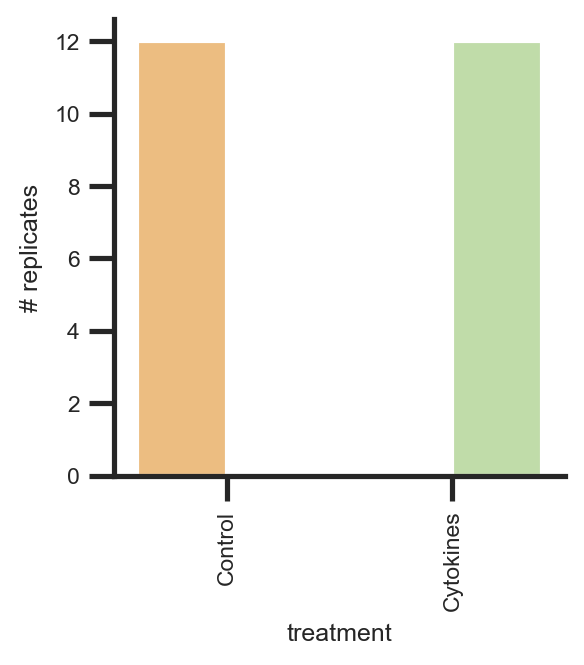

In [10]:
napari_spacem_qc.qc_plots.plot_replicate_coverage(
        report_config=report_config)

Finally, we print the metadata table, so you can have a look at the metadata columns and values and which datasets are masked:

In [11]:
qc_plots.mprint(
napari_spacem_qc.qc_plots.print_metadata_table(
    report_config=report_config)
)

[Go back to index](#main_index)

,datasetName,datasetId,treatment,only_EMBL,slide,row,col,repl_number,short_name,group,submitter,PI,organism,organismPart,condition,growthConditions,ionisationSource,maldiMatrix,analyzer,resPower400,polarity,uploadDateTime,FDR@10%,database,opticalImage,well_number,facility,replicate_nb_per_slide,replicate_nb_overall,only_UOW
0,24-03-28_AusNeuronal_Slide5_P14D14_Well5_SS25_A31_100x100_DHApos,2024-04-01_23h06m55s,Control,False,5,B,1,Control-1,5-B1,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-01T23:06:55.480,182,ChEBI - 2018-01,No optical image,5,EMBL,1,1,True
23,24-03-28_AusNeuronal_Slide6_P14D14_Well7_SS25_A31_100x100_DHApos,2024-04-16_23h30m17s,Control,False,6,B,3,Control-12,6-B3,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:30:17.581,142,ChEBI - 2018-01,No optical image,7,EMBL,4,12,True
22,24-03-28_AusNeuronal_Slide6_P14D14_Well8_SS25_A31_100x100_DHApos,2024-04-16_23h29m09s,Cytokines,False,6,B,4,Cytokines-12,6-B4,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:29:09.579,175,ChEBI - 2018-01,No optical image,8,EMBL,4,12,True
21,24-03-28_AusNeuronal_Slide6_P14D14_Well5_SS25_A31_100x100_DHApos,2024-04-16_23h32m39s,Control,False,6,B,1,Control-11,6-B1,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:32:39.588,116,SwissLipids - 2018-02-02,No optical image,5,EMBL,3,11,True
20,24-03-28_AusNeuronal_Slide6_P14D14_Well4_SS25_A31_100x100_DHApos,2024-04-16_23h32m52s,Control,False,6,A,4,Control-10,6-A4,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:32:52.583,166,ChEBI - 2018-01,No optical image,4,EMBL,2,10,True
19,24-03-28_AusNeuronal_Slide6_P14D14_Well2_SS25_A31_100x100_DHApos,2024-04-16_23h33m16s,Control,False,6,A,2,Control-9,6-A2,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:33:16.583,207,SwissLipids - 2018-02-02,No optical image,2,EMBL,1,9,True
18,24-03-28_AusNeuronal_Slide6_P14D14_Well3_SS25_A31_100x100_DHApos,2024-04-16_23h33m00s,Cytokines,False,6,A,3,Cytokines-11,6-A3,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-16T23:33:00.581,149,ChEBI - 2018-01,No optical image,3,EMBL,3,11,True
16,24-03-28_AusNeuronal_Slide6_P14D14_Well6_SS25_A31_100x100_DHApos,2024-04-17_21h53m26s,Cytokines,False,6,B,2,Cytokines-9,6-B2,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-04-17T21:53:27.015,174,ChEBI - 2018-01,No optical image,6,EMBL,1,9,True
15,24-03-28_AusNeuronal_Slide4_P14D14_WellA1_SS25_A31_100x100_DHApos,2024-03-28_23h25m59s,Cytokines,False,4,A,1,Cytokines-8,4-A1,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-03-28T23:25:59.877,178,ChEBI - 2018-01,No optical image,A1,EMBL,4,8,True
14,24-03-28_AusNeuronal_Slide5_P14D14_Well1_SS25_A31_100x100_DHApos,2024-03-30_19h50m43s,Cytokines,False,5,A,1,Cytokines-7,5-A1,♡EMBL♡,Mohammed Shahraz,Theodore Alexandrov,Homo sapiens (human),brain cells,Wildtype,nan,MALDI,"2,5-dihydroxyacetophenone (DHA)",Orbitrap,98995,positive,2024-03-30T19:50:43.639,197,SwissLipids - 2018-02-02,No optical image,1,EMBL,4,7,True


<IPython.core.display.Markdown object>

Let's also print the slide layouts:

[Go back to index](#main_index)

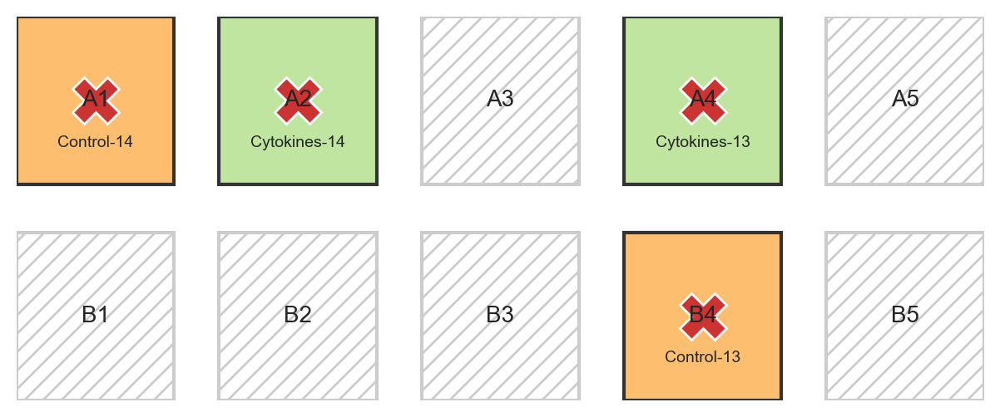

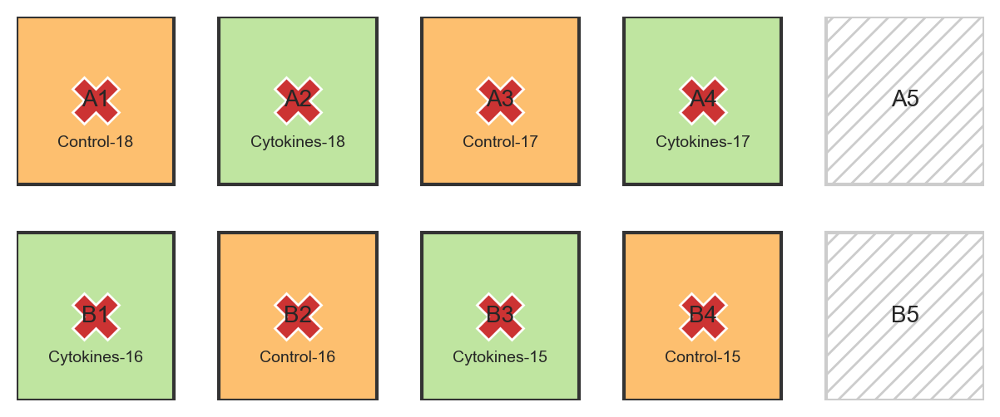

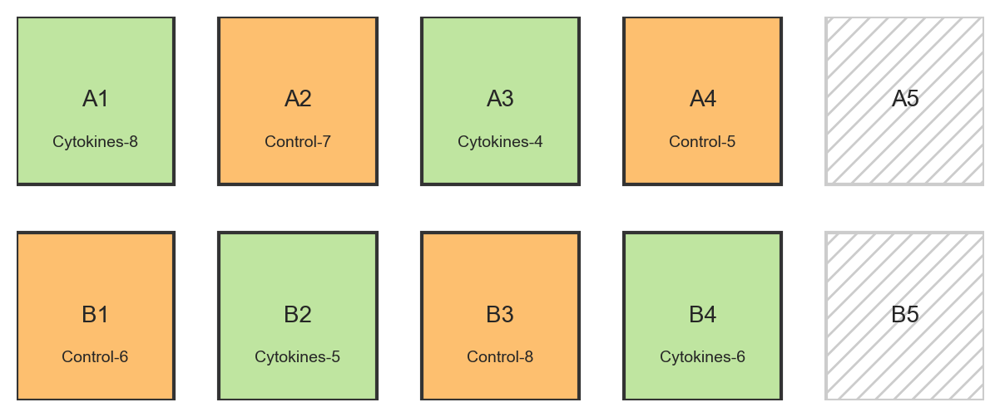

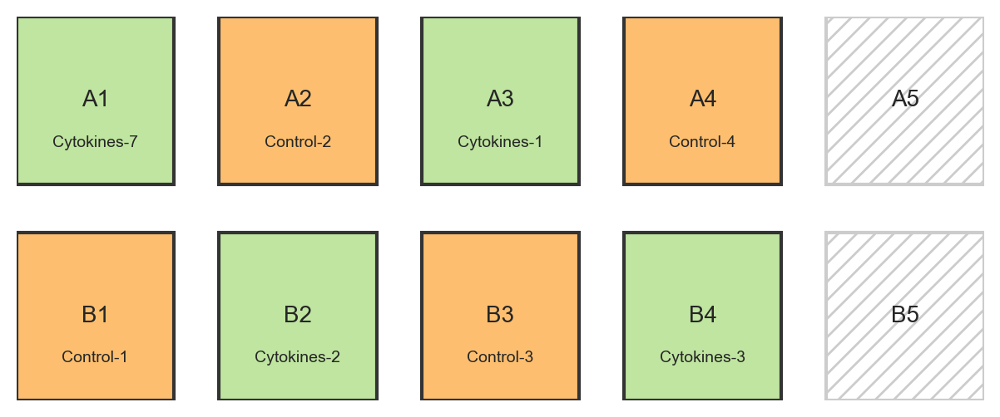

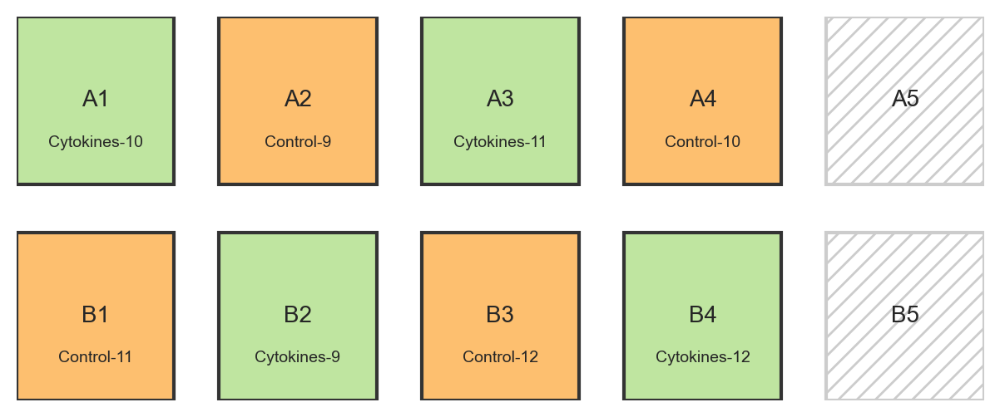

In [12]:
# Print all slide layouts:
qc_plots.plot_well_layouts(report_config=report_config)

## 2. Loading datasets
Now we load the metadata table and the datasets (this function will automatically understand whether to load data from the spatialdata format or from a Anndata file pattern):

In [13]:
# We only load datasets that are not masked by `report_config.general.masking_key`:
masked_metadata: pd.DataFrame = report_config.general.masked_metadata

adata = bulk_read_from_qc_config(
        report_config=report_config,
        metadata=masked_metadata,
        verbose=True,
        adata_to_load=adata_to_load
)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:03<00:00,  6.48it/s]


### Optional: Loading additional AnnData files from other projects or external sources
Keep in mind that you can always load additional AnnData files from other projects: you can do so by manually specifying an `adata_file_pattern`. However, these extra datasets will not be displayed in the metadata table or slide-layout associated to the main configuration file you loaded initially.

In [14]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
# When set to True, make sure to customize the variables defined in the next cells:
load_extra_adatas = False
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

In [15]:
# Example: Load additional datasets from a different project
if load_extra_adatas:
    adata_pattern = "/path/to/your/adata/files/slide{slide}-{row}{col}.h5ad"
    extra_metadata_df = pd.read_csv("/path/to/your/metadata.csv")
    extra_adata_1 = osm.io.bulk_read(
                extra_metadata_df,
                file_pattern=adata_pattern,
                quiet=True,
                merge="first",  # Make sure that adata.var cols are kept
                fill_value=0,
                join="inner"
    )

or you can load it from an extra `spatialdata` directory:

In [16]:
from napari_spacem_qc.anndata_utils import bulk_adata_read_from_spatialdata

# Example 2: Load additional datasets from a different SpaceM project using the `spatialdata` data format
if load_extra_adatas:
    extra_report_config = SpaceMQCConfigFile.create_config_from_yaml_file("/path/to/your/extra_config.yml")
    assert extra_report_config.general.spacem_processing_done, "The extra config file must have the `spacem_processing_done` flag set to `true`"
    assert extra_report_config.spacem_processing_options.use_spatialdata, "It looks like the extra config file is not using the `spatialdata` format"
    extra_adata_2 = bulk_adata_read_from_spatialdata(
        spatialdata_path=report_config.spacem_processing_options.spatialdata_path,
        metadata=extra_report_config.general.masked_metadata,
        instances_to_load=extra_report_config.type_of_instances,
        slide_key=extra_report_config.general.slide_key,
        row_key=extra_report_config.general.row_key,
        col_key=extra_report_config.general.col_key,
        verbose=True,
    )

Finally, we can merge all loaded datasets:

In [17]:
from outer_spacem.io import merge_adata_var
import anndata

# Merge all datasets:
if load_extra_adatas:
    all_adatas = [adata, extra_adata_1, extra_adata_2]
    adata = anndata.concat(adatas=all_adatas,
                           merge="first",  
                           fill_value=0,
                           join="inner"
    )
    
    # Manually merge var columns to prevent loss of information:
    adata = merge_adata_var(all_adatas, adata)

## 3. Preprocessing and filtering

### Filtering and Quality control

Let's first perform some quality control. For starters, let's check the size of our dataset:

In [18]:
# `adata_shape_stats` is a dataframe containing some basic statistics about the shape of the dataset, so you can keep track of the number of cells/pixels and  ions, at each step of the filtering steps:
adata_shape_stats = anndata_utils.get_adata_shape_stats_df(
        adata,
        type_of_instances=target_instances,
)

adata.shape

(240000, 138)

Next, we're going to mask the background pixels. This is a crucial, as it removes the background pixels from the dataset, which are not informative for the analysis and can distort the results. 

This step is not necessary for single-cell data.

In [19]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
mask_background_pixels = True
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

if mask_background_pixels and target_instances == "pixels":
    adata, adata_shape_stats = anndata_utils.mask_outer_cell_pixels(
        adata,
        min_am_sampling_ratio=report_config.adata_options.spacem_am_adata_options.min_am_sampling_ratio,
        adata_shape_stats=adata_shape_stats)

### Filtering cells and ions

  First, let's get some more detailed QC metrics:

In [20]:
# Before filtering, calculate QC metrics:
pre_filtering_cell_qc, pre_filtering_ion_qc = \
    sc.pp.calculate_qc_metrics(adata,
                               percent_top=None)

Cells with only few annotations may not have been sampled by the MALDI laser sufficiently, and should therefore be removed.  
Ions that are only present in a few cells will contain only little biological information, and removing them reduces dataset complexity.
  
Keep in mind however that the threshold for both filtering steps should be adapted to your own analysis (you can use the histogram plotted below to get an idea):

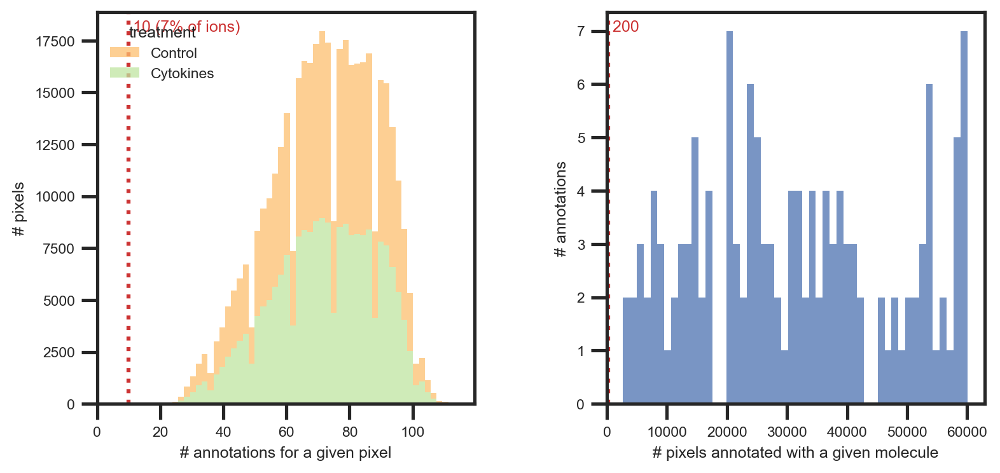

In [21]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
min_annotations_per_instance = report_config.general.filtering_options.min_annotations_per_pixel
min_instances_per_annotation = report_config.general.filtering_options.min_pixels_per_annotation
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

# Plot histograms of the number of cells/ions (colored by condition)
fig = qc_plots.plot_anndata_stats(
            adata,
            pre_filtering_cell_qc,
            pre_filtering_ion_qc,
            type_of_instances=target_instances,
            min_annotations_per_instance=min_annotations_per_instance,
            min_instances_per_annotation=min_instances_per_annotation,
            report_config=report_config,
)

Finally, we actually do the filtering:

In [22]:
# In the following, "instances" refers to either "cells" or "pixels", depending on the type of analysis you are performing:
adata, adata_shape_stats = anndata_utils.apply_qc_filters(
    adata,
    min_annotations_per_instance=min_annotations_per_instance,
    min_instances_per_annotation=min_instances_per_annotation,
    target_instances=target_instances,
    adata_shape_stats=adata_shape_stats
)

And we print the statistics of the datasets loaded after filtering all filtering steps: 

In [23]:
# Check if there is any data left:
if (adata.shape[0] == 0) or (adata.shape[1] == 0):
    assert adata.shape[0] > 0, \
        f"ERROR: No {target_instances} left after filtering. " \
        f"Details:\n {adata_shape_stats}"
    assert adata.shape[1] > 0, \
        f"ERROR: No ions left after filtering. " \
        f"Details:\n {adata_shape_stats}"
    
adata_shape_stats

,# pixels,# annotations,Comments/Suggestions
After loading datasets jointly,240000,138,When few or too many annotations are found at ...
After masking extra-cellular pixels,60009,138,"If few pixels are left at this stage, you may ..."
After filtering annotations found in less than 200 pixels and pixels with less than 10 annotations,60009,138,If not many pixels and/or annotations are left...


### Normalization

Technical aspects of MS imaging for SpaceM cause significant variance in how much biological material is sampled, similarly to varying sequencing depth in scRNA-seq. 
As this sampling variance can severely distort downstream analysis, we're going to apply some normalization to mitigate for it.

The simplest way to do this is by scaling a cell's ion counts using a size factor porportional to the total ion count (TIC) of the cells - commonly referred to as TIC normalization:

In [24]:
sc.pp.normalize_total(adata, target_sum=1e4)

### Scaling
Other single-cell omics may require you to scale intensities to achieve more normally distributed counts. For SpaceM data this is not recommended however:  

- Log (or log1p) scaling is commonly used in sequencing-based single-cell analyses to reduce data skewness, but has shown to actually drown out biological information in SpaceM data.
- Z scoring (i.e. centering to 0 and scaling to as standard deviation of 1) has no consensus even in other single-cell omics, from experience it can severely distort SpaceM data.

Therefore, in addition to TIC normalization, we're going to apply a log1p transformation.  
This aims at reducing the skewness of the data, and at better matching the assumption of many downstream analysis tools that counts are normally distributed.

In [25]:
adata.raw = adata

In [26]:
sc.pp.log1p(adata)

### Dimensionality reduction

We'll perform some dimensionality reduction in order to get a visual overview of our data.
In short, we'll create a **U**niform **M**anifold **A**pproximation and **P**rojection (UMAP) representation of our data that will give us a overview of the 
biological (i.e. wanted) and technical (i.e. unwanted) variance within the sample e.g. similarity of cell types, conditions or replicates.

You can read more about dimensionality reduction in single-cell analysis [here](https://chanzuckerberg.github.io/scRNA-python-workshop/analysis/03-dimensionality-reduction.html).

In [27]:
# Perform PCA:
sc.pp.pca(adata)

### Optional: Batch correction

Here we also have the option to apply batch correction, which is often useful in single-cell analysis: (keep in mind that this step may require some time)

In [28]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
bbknn_key = report_config.pixel_and_cell_qc.bbknn_key if report_config.pixel_and_cell_qc.apply_bbknn else None
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

In [29]:
# If bbknn_key is not None, we apply bbknn integration:
if bbknn_key is not None:
    assert isinstance(bbknn_key, str), "Please pass a string as " \
                                       "bkknn_key parameter"
    qc_plots.mprint(f"""**BBKN was applied** (using `{bbknn_key}` as batch key)""")
    sc.external.pp.bbknn(adata, batch_key=bbknn_key)
else:
    sc.pp.neighbors(
        adata, random_state=12345)  # only used when integration with bbknn is not applied

**BBKN was applied** (using `slide` as batch key)

Finally, we create the UMAP:

In [30]:
# Finally, we create the UMAP:
sc.tl.umap(adata, random_state=12345, )

In [31]:
# to_be_saved = adata.obs.drop(columns=['growthConditions', 'resPower400'])
# adata.write('/Users/alberto-mac/Documents/DA_ESPORTARE/LOCAL_EMBL_FILES/g_shared/shared/alberto/projects/spacem-reports/australia-project/2024/all_neurons/v1_analysis/after_UMAP.h5ad')

## 4. Initial QC plots (PCA and UMAP)
First, we reindex the obs dataframe, otherwise we may encounter some errors in the following plots:

In [32]:
adata.obs_names_make_unique()

### PCA 
Let's start from PCA plots:

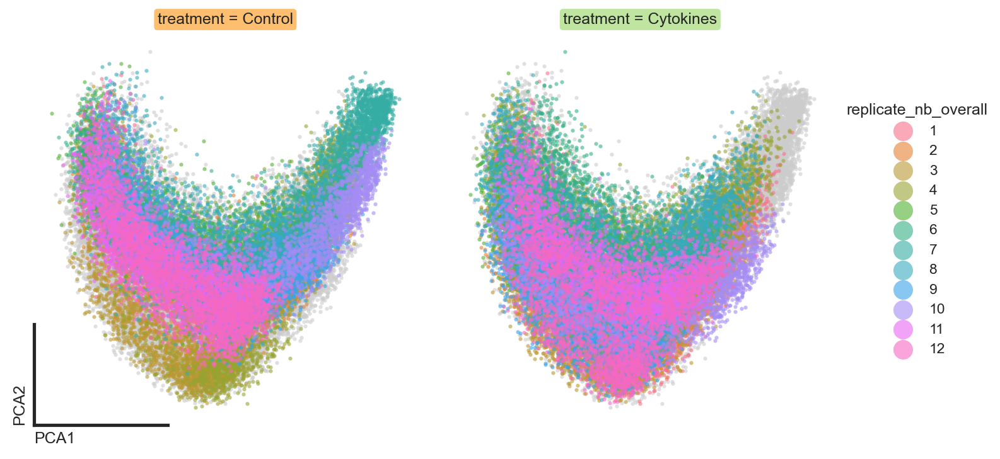

In [33]:
# You can specify `hue` and `col` parameters to color the plot according to different metadata columns if you wish, otherwise the `bio_key` will automatically used to color the plot and create columns:  
qc_plots.wrapper_highlight_scatterplot(
    adata,
    obsm_key="X_pca",
    report_config=report_config,
    # hue="my_custom_color_metadata_column",
    # col="my_custom_metadata_column",
    # repl_key = "my_custom_repl_key",
    # palette = "husl",
    # marker_scale = 5,
    # add_legend = True,
    # **extra_kwargs_highlight_scatterplot
)

### UMAP
Moving on to UMAP plots:

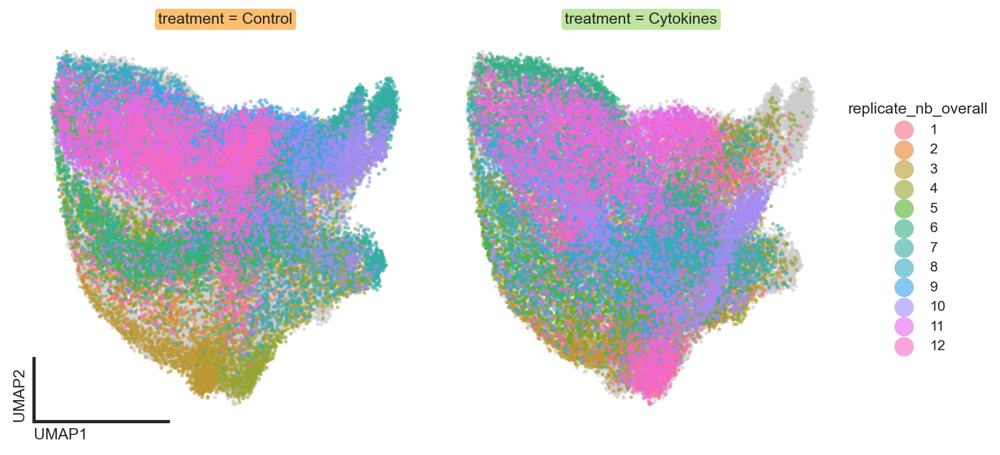

In [34]:
qc_plots.wrapper_highlight_scatterplot(
            adata,
            obsm_key="X_umap",
            report_config=report_config,
            # hue="my_custom_color_metadata_column",
            # col="my_custom_metadata_column",
        )

Potential variance in UMAP associated with **x/y position of well on slide**:

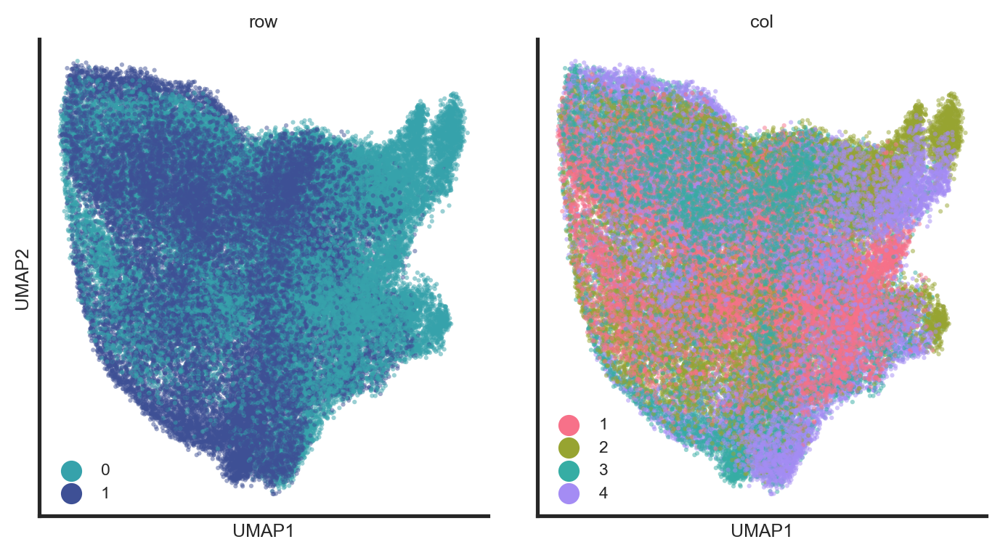

In [35]:
# Potential variance in UMAP associated with **x/y position of well on slide**:
qc_plots.umap_scatter_plot_variance_well_positions(
    adata,
    row_key=report_config.general.row_key,
    col_key=report_config.general.col_key,
)

Potential variance in UMAP associated with **acquisition order and slide number** (independent on condition). Darker points represent datasets that were acquired first (assuming that wells were acquired starting from top-left corner, e.g. A1, to bottom-right corner, e.g. J4):

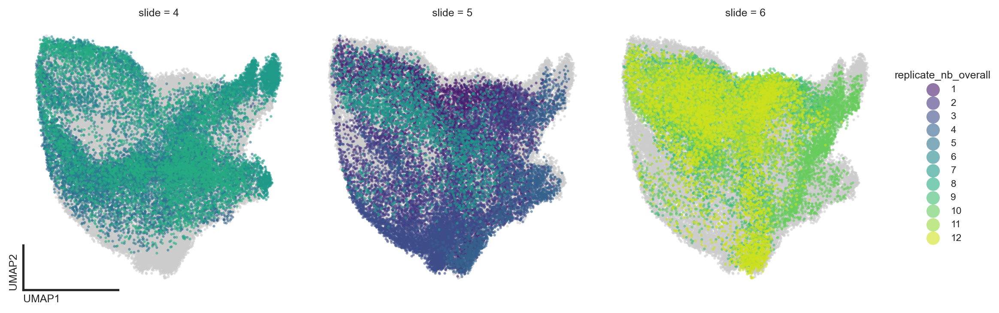

In [36]:
# FIXME: bio key is MODIFIED!

# # Sort by row and column, because usually A1 is the first acquired well
# # and J4 the last:
# adata.obs.sort_values(by=[report_config.general.row_key, report_config.general.col_key], inplace=True)
# dataset_id_key = report_config.general.dataset_id_key
# unique_dataset_ids = adata.obs[dataset_id_key].unique()
# adata.obs['acquisition_order'] = adata.obs[
#     dataset_id_key].replace(
#     unique_dataset_ids,
#     np.arange(1, unique_dataset_ids.shape[0] + 1)).astype(
#     'category')

qc_plots.wrapper_highlight_scatterplot(
    adata,
    obsm_key="X_umap",
    report_config=report_config,
    col=report_config.general.slide_key,
    # hue="acquisition_order",
    palette="viridis",
    add_legend=True
)

## 5. Distance between datasets
First, let's choose a metric to calculate the distance between datasets. The most common one is the Euclidean distance, but you can also choose other metrics like the cosine distance.

In [37]:
### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
metric = report_config.pixel_and_cell_qc.distance_metric # Choose for example between "euclidean" and "cosine"
### -------------------- USER-DEFINED PARAMETERS: END --------------------- ###

The distances displayed in the following heatmap represent distances between the average PCA representation of each dataset:

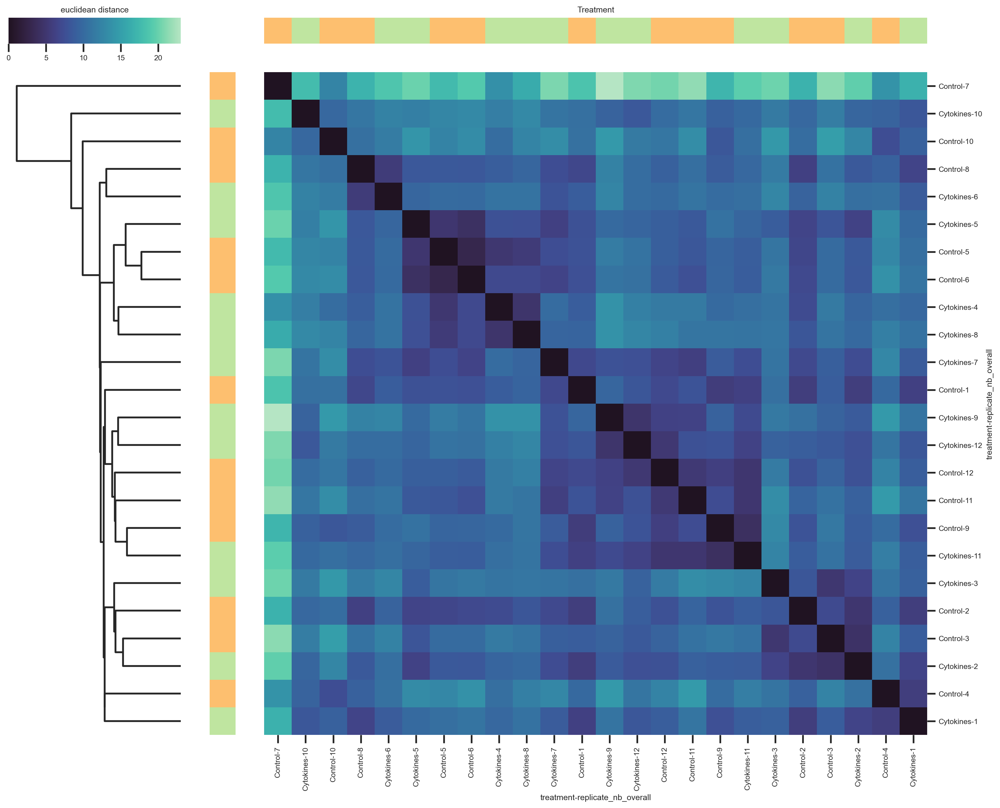

In [38]:
g = napari_spacem_qc.qc_plots.clustermap(
    adata, 
    groupby=[report_config.general.bio_key, report_config.general.repl_key], 
    palette=report_config.general.palette_series,
    metric=metric
)
plt.show()

### Intra-label vs. inter-label distance
The distances displayed in the following plot represent Euclidean distances between the average PCA representation of each dataset:

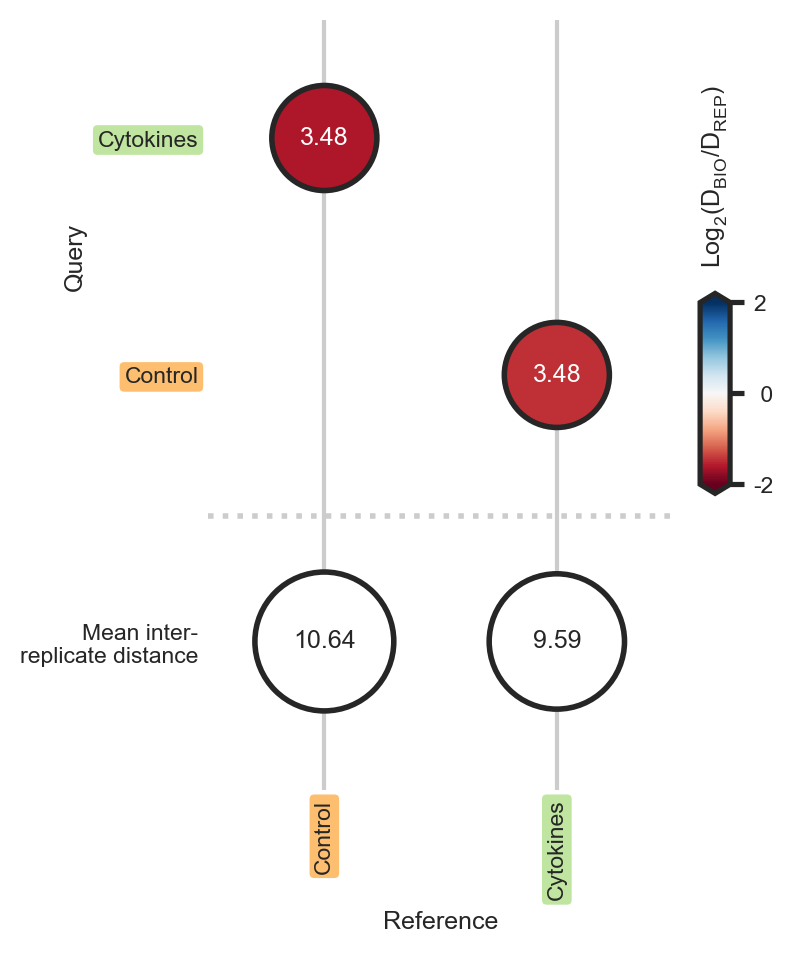

In [39]:
fig_dist_ratios = napari_spacem_qc.qc_plots.dist_ratios(
    adata, 
    bio_label=report_config.general.bio_key, 
    repl_label=report_config.general.repl_key,
    palette=report_config.general.palette_series,
    metric = metric,
    print_legend=False
)

## 7. Differential Analysis

In [40]:
from pathlib import Path
import matplotlib as mpl

### -------------------- USER-DEFINED PARAMETERS: START ------------------- ###
output_dir = Path(os.path.split(report_config.config_path)[0]) / "SC_analysis_results"
### -------------------- USER-DEFINED PARAMETERS: STOP ------------------- ###
output_dir.mkdir(exist_ok=True, parents=True)
sc._settings.ScanpyConfig.figdir = output_dir
mpl.rcParams['savefig.directory'] = str(output_dir)

After identifying groups of cells we might want to know what makes these groups unique, for which we are going to perform differential analysis.

To identify which ions are differentially abundant between groups of cells, we will use a series of 1-vs-rest wilcoxon rank-sum tests for each ion:

In [41]:
# Perform differential analysis:
sc.tl.rank_genes_groups(adata,
                        groupby=report_config.general.bio_key, method="wilcoxon",
                        use_raw=True)

# Prepare the data:
lower, upper = np.quantile(adata.raw.X, [0.01, 0.99],
                           axis=0)
adata.layers["clipped"] = np.clip(adata.raw.X, lower, upper)

Let's check out which ions are most associated with each of our four groups:

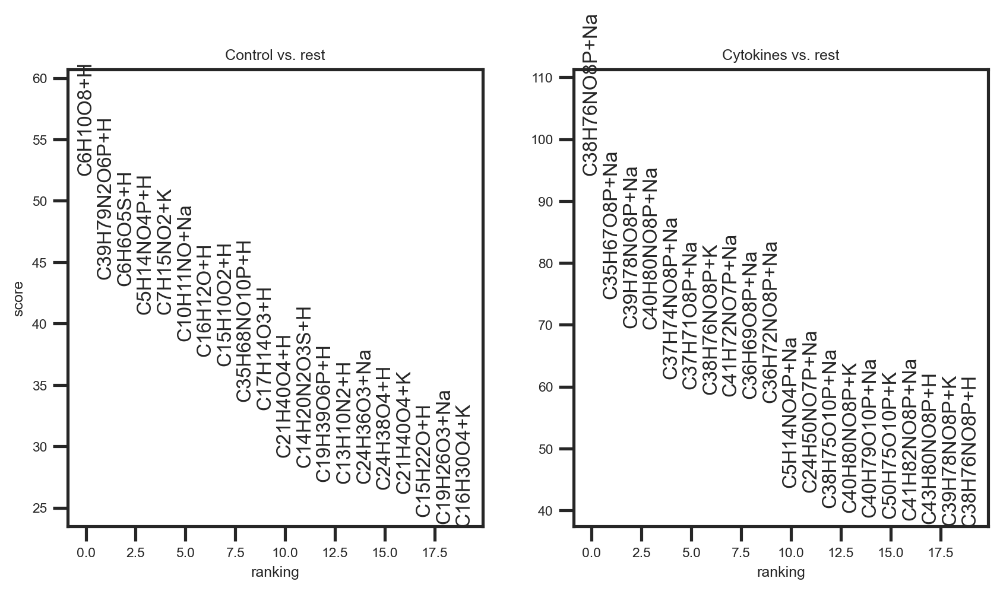

In [42]:
sc.pl.rank_genes_groups(adata, sharey=False, fontsize=12, gene_symbols="annotation_id", filename="test", show=False)
plt.savefig(output_dir / "rank_genes_groups_leiden.pdf", bbox_inches="tight")

And now let's see the same plots with the first molecule names:

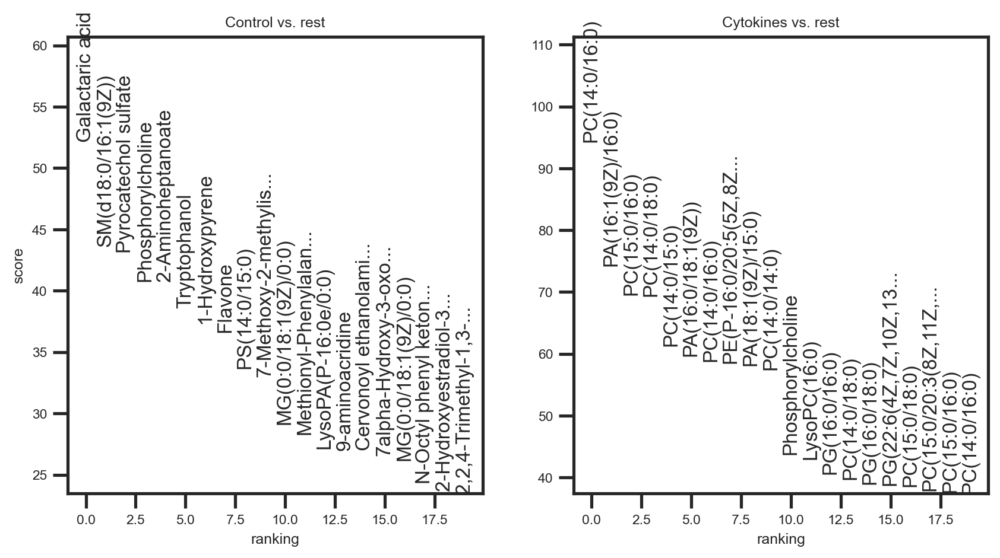

In [43]:
from napari_spacem_qc.various_utils import add_first_short_name_to_adata

# You may need to adjust how many characters are kept from the molecule name, 
# or specify a pattern that is a combination of ion-formula and short-name, e.g. "{ion_formula} ({short_first_mol_name})":
adata = add_first_short_name_to_adata(adata, 
                                name_added_col="rank_gen_mol_name",
                                max_nb_chars_mol_name= 20,  # How many characters to keep from the first molecule name 
                                pattern_name= "{short_first_mol_name}" # Pattern used to print molecule names (possibly together with ion formula)
                                     )

sc.pl.rank_genes_groups(adata, sharey=False, fontsize=12, gene_symbols="rank_gen_mol_name", show=False)
plt.savefig(output_dir / "rank_genes_groups_leiden_mol_names.pdf", bbox_inches="tight")

We can also visualize the abundance of these ions on our UMAP:

To avoid high ion intensities dominating the plots, let's apply some hotspot clipping:

##### UMAPs relevant markers Treatment: Control

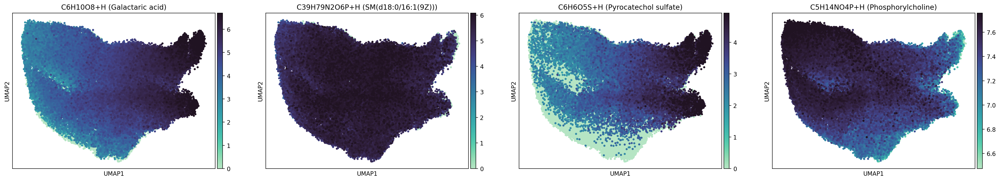

##### UMAPs relevant markers Treatment: Cytokines

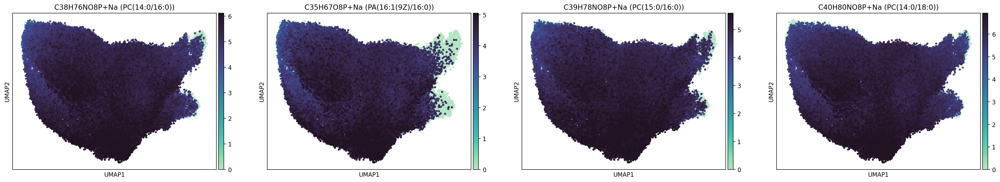

In [49]:
all_plots = DE_plots.umap_plots_significant_ions(
    adata,
    nb_top_ions_to_plot=4,
    cmap="mercury",
    s=50,
    max_nb_chars_mol_name = 25,  # How many characters to keep from the first molecule name
    pattern_first_mol_name = "{ion_formula} ({short_first_mol_name})", # Pattern used to print molecule names (possibly together with ion formula)
    save_figures = True,
    output_dir = output_dir,
)

#### Volcano plots

Finally, we can also plot volcano plots for each cluster. However, often these plots look quite messy, so you will need to play around with the parameters (font sizes & Co) to get a good overview.

The following code will also save CSV files with the most significant ions for each cluster:

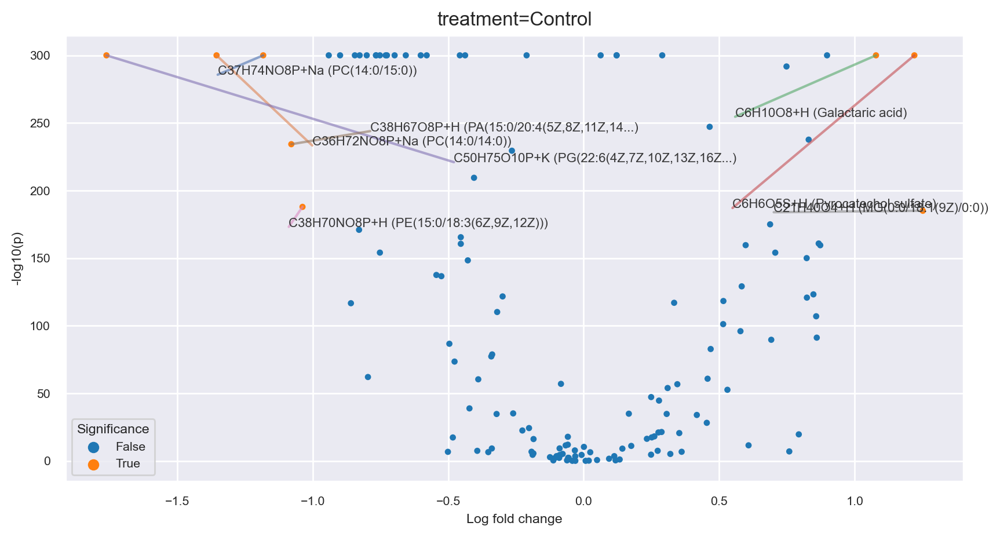

In [48]:
leiden_options = report_config.pixel_and_cell_qc.leiden_clustering_options

sns.set(font_scale=0.7)

DE_plots.make_DE_volcano_plots(
                adata,
                # csv_file_prefix="my_custom_file_prefix",
                output_dir=str(output_dir), # Specify the output directory where to save the csv files
                save_csv_significant_molecules=leiden_options.save_csv_significant_molecules, # Save a CSV with the list of the most relevant markers to output directory
                max_labels_per_volcano_plot=leiden_options.max_labels_per_volcano_plot, # Max number of relevant molecule names to show on volcano plots
                pval_thres=leiden_options.pval_thres, # Default: 0.05
                fc_thres=leiden_options.fc_thres, # Default: 2
                display_table=False, # Plot the CSV tables with the full list of relevant markers
                text_random_shift=0.45, # Increase this to randomly shift positions of mol. names in the plot by a greater amount
                text_label_size=8, # Font size of the molecule names
                figsize=(10, 5), # Shape of the generated plots
                max_nb_chars_mol_name = 25, # How many characters to keep from the first molecule name
                pattern_first_mol_name = "{ion_formula} ({short_first_mol_name})", # Pattern used to print molecule names (possibly together with ion formula)
                save_figures = True,
)

sns.set(font_scale=SNS_FONT_SCALE)
plt.rcdefaults() # TODO: remove, no longer necessary